## Import cell countings

In [1]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import copy

from readCSV_helpers_v2 import *

In [2]:
animal_list = ['TRIO2_11261_Lukas', 'TRIO2_11876_Lukas_v2']
root = '/Users/lukasvandenheuvel/Documents/GRAFF Lab/2021_RabiesTracing/TRIO/'
path_to_onotlogy_pickle = '../AllenMouseBrainOntology.pk'

# Load brain ontology (brain hierarchy)
with open(path_to_onotlogy_pickle,"rb") as f:
    ontology_dict = pickle.load(f)
edges = ontology_dict['BrainOntologyEdges']
tree = ontology_dict['BrainOntologyTree']
brain_region_dict = ontology_dict['BrainOntologyRegions']

In [3]:
tracers = ['RAB', 'CTB', 'TVA', 'RAB_TVA']         # Tracers we are interested in.
hemispheres = ['Left', 'Right', 'Sum']  # Store the seperate hemispheres, and the sum of the hemispheres.

# Initialize a results dataframe.
# This is a dataframe with hierarchical columns. Hierarchy: tracer -> animal -> hemisphere.
iterables = [tracers, animal_list, hemispheres]
multi_index = pd.MultiIndex.from_product(iterables)
results = pd.DataFrame(np.nan, index=brain_region_dict.keys(), columns=multi_index)

# Loop over animals
for animal in animal_list:

    print('Importing slices in '+animal+'...')
    input_path = os.path.join(root, animal, 'results')

    # Load regions to exclude for this animal
    path_to_exclusion_file = os.path.join(root, animal, 'RegionsToExclude.csv')
    if not(os.path.exists(path_to_exclusion_file)):
        raise ValueError('Cannot find exclusion file for animal ' + animal + '!')
    exclude_dict = list_regions_to_exclude(path_to_exclusion_file)
    
    # Load cell counts, excluding the regions we want to exclude
    df_list,slice_regions,slice_data = load_cell_counts(input_path, exclude_dict, edges, tree)
    print('Imported ' + str(len(df_list)) + ' slices.\n')
    
    # Now comes the tricky part. We'll first concatenate the dataframes
    # of all slices into one big dataframe (brain_df).
    # Then, we combine the rows with the same index (=region name), and sum them.
    # That is, we sum the results (area, cell counts) per region across slices.
    brain_df = pd.concat(df_list)
    brain_df = brain_df.groupby(brain_df.index, axis=0).sum()

    # Normalize the results
    for t in tracers: # loop over tracers ('RAB', 'CTB', ...)

        # Normalize
        normalized_cell_counts = normalize_cell_counts(brain_df, t)
        
        # Save results per animal
        present_regions = normalized_cell_counts.index.to_list()
        for region in present_regions: # loop over all regions present
            results.loc[region, (t,animal)].update( normalized_cell_counts.loc[region] )

# Swap hierarchy of columns, to make averaging over animals easier.
# The new hierarchy will be Tracer -> Hemisphere -> Animal
results = results.swaplevel(axis=1)
#results = results.replace(np.inf, np.nan)

Importing slices in TRIO2_11261_Lukas...
Imported 108 slices.



/Users/lukasvandenheuvel/opt/anaconda3/envs/trio/lib/python3.9/site-packages/pandas/core/indexing.py:889: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


Importing slices in TRIO2_11876_Lukas_v2...
Imported 118 slices.



/Users/lukasvandenheuvel/opt/anaconda3/envs/trio/lib/python3.9/site-packages/pandas/core/indexing.py:889: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


In [4]:
# Calculate means and sems
iterables = [tracers, ['PerHemi', 'SummedHemi'], ['Mean', 'Sem']]
multi_index = pd.MultiIndex.from_product(iterables)
mean_results = pd.DataFrame(np.nan, index=results.index, columns=multi_index)

for t in tracers:
    
    # Normalization per hemisphere: Treat 'Left' and 'Right' as seperate animals to calculate average
    mean_results.loc[:, (t,'PerHemi','Mean')] = results[t][['Left','Right']].mean(axis=1)
    mean_results.loc[:, (t,'PerHemi','Sem')] = results[t][['Left','Right']].sem(axis=1)
    
    # Normalization with summed hemispheres: Sum left and right, and average over animals.
    mean_results.loc[:, (t,'SummedHemi','Mean')] = results[t]['Sum'].mean(axis=1)
    mean_results.loc[:, (t,'SummedHemi','Sem')] = results[t]['Sum'].sem(axis=1)

In [5]:
mean_results

RAB                                      CTB            \
         PerHemi           SummedHemi             PerHemi             
            Mean       Sem       Mean       Sem      Mean       Sem   
root    1.000000  0.000000   1.000000  0.000000  1.000000  0.000000   
grey    1.038272  0.009094   1.039188  0.008523  1.074625  0.012286   
CH      0.438545  0.082131   0.438012  0.140953  1.652253  0.047761   
CTX     0.314962  0.065857   0.315848  0.112037  1.878061  0.092365   
CTXpl   0.308307  0.073333   0.309930  0.123213  1.491854  0.071405   
...          ...       ...        ...       ...       ...       ...   
ipf          NaN       NaN        NaN       NaN       NaN       NaN   
pms          NaN       NaN        NaN       NaN       NaN       NaN   
pfs          NaN       NaN        NaN       NaN       NaN       NaN   
IPF          NaN       NaN        NaN       NaN       NaN       NaN   
retina       NaN       NaN        NaN       NaN       NaN       NaN   

                                  TVA                                 \
       SummedHemi             PerHemi           SummedHemi             
             Mean       Sem      Mean       Sem       Mean       Sem   
root     1.000000  0.000000  1.000000  0.000000   1.000000  0.000000   
grey     1.076046  0.010656  1.073855  0.008148   1.074456  0.011648   
CH       1.655336  0.060784  0.044619  0.009363   0.039740  0.009091   
CTX      1.887614  0.067367  0.051533  0.012848   0.046179  0.015907   
CTXpl    1.497638  0.068957  0.044058  0.014391   0.039003  0.018228   
...           ...       ...       ...       ...        ...       ...   
ipf           NaN       NaN       NaN       NaN        NaN       NaN   
pms           NaN       NaN       NaN       NaN        NaN       NaN   
pfs           NaN       NaN       NaN       NaN        NaN       NaN   
IPF           NaN       NaN       NaN       NaN        NaN       NaN   
retina        NaN       NaN       NaN       NaN        NaN       NaN   

         RAB_TVA                                 
         PerHemi           SummedHemi            
            Mean       Sem       Mean       Sem  
root    1.000000  0.000000   1.000000  0.000000  
grey    1.092480  0.015905   1.084918  0.022232  
CH      0.071769  0.037585   0.065026  0.056353  
CTX     0.094020  0.049193   0.085173  0.073694  
CTXpl   0.098199  0.051417   0.088953  0.077017  
...          ...       ...        ...       ...  
ipf          NaN       NaN        NaN       NaN  
pms          NaN       NaN        NaN       NaN  
pfs          NaN       NaN        NaN       NaN  
IPF          NaN       NaN        NaN       NaN  
retina       NaN       NaN        NaN       NaN  

[1327 rows x 16 columns]

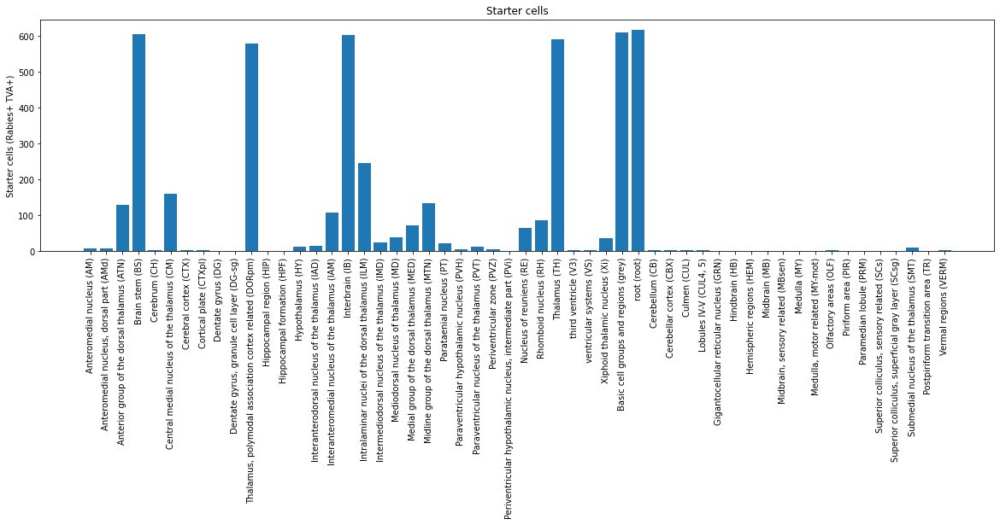

In [6]:
# Starter cell analysis
starter_cells = brain_df['RAB_TVA']
starter_cells = starter_cells[starter_cells > 0]
starter_cells_sorted = sort_hemispheres(starter_cells)

# Plot starter cells
index = ['%s (%s)'%(brain_region_dict[key],key) for key in starter_cells_sorted.index]
plt.figure(figsize=(20,5))
plt.tight_layout()
b = plt.bar(index, starter_cells_sorted['Sum'])
t = plt.xticks(rotation=90)
t = plt.title('Starter cells')
lbl = plt.ylabel('Starter cells (Rabies+ TVA+)')
output_path = os.path.join(root, animal, 'python_results')
output_file = os.path.join(output_path, 'starter_cells.pdf')
plt.savefig(output_file, bbox_inches='tight')

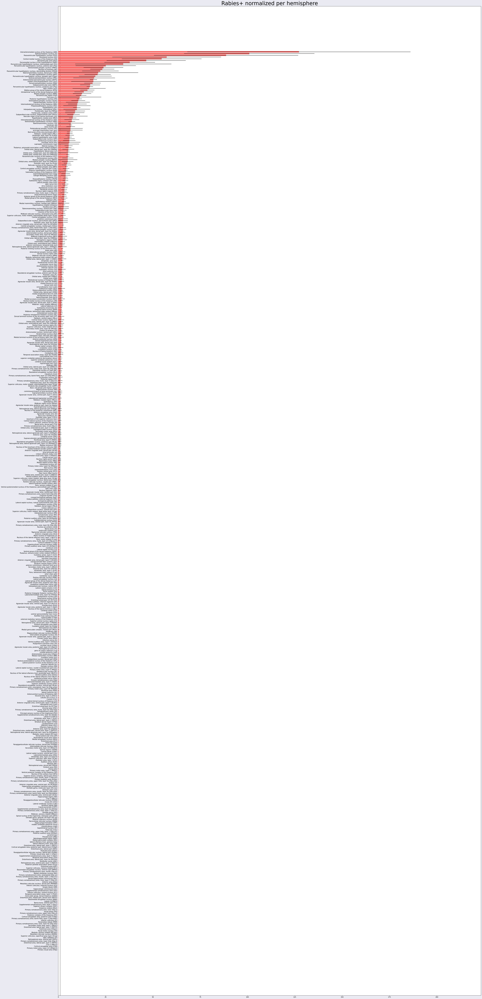

In [7]:
# Plot Rabies+ normalized per hemisphere
x_label = '(Rabies+ / Dapi area) / (total Rabies+ / total Dapi area)'

rabies = mean_results['RAB']['PerHemi']
fig = plot_horizontal_bar_chart(rabies, brain_region_dict)

plt.title('Rabies+ normalized per hemisphere',fontsize=35)
output_file = os.path.join(root, 'rabies_normalized_per_hemi.pdf')
plt.savefig(output_file, bbox_inches='tight')
plt.show()

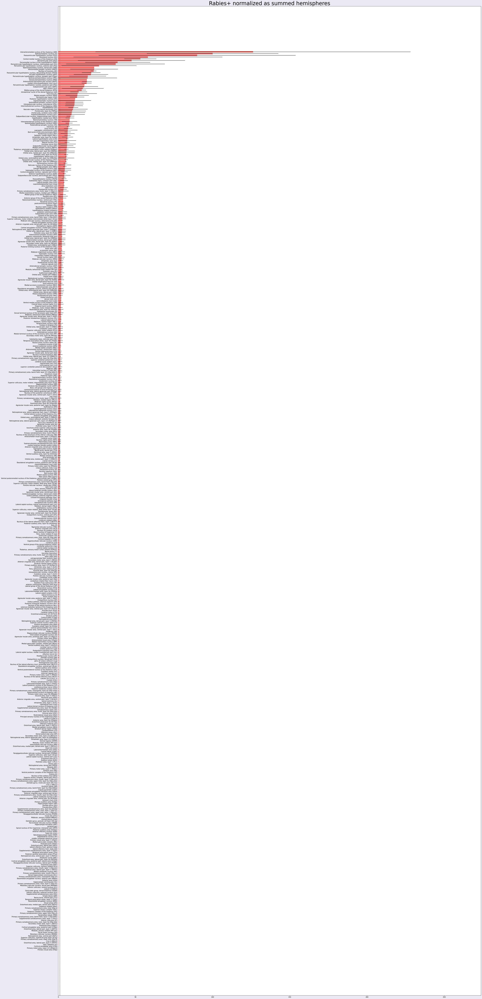

In [8]:
# Plot Rabies+ normalized with summed hemispheres
rabies = mean_results['RAB']['SummedHemi']
fig = plot_horizontal_bar_chart(rabies, brain_region_dict)

plt.title('Rabies+ normalized as summed hemispheres',fontsize=35)
output_file = os.path.join(root, 'rabies_normalized_sum.pdf')
plt.savefig(output_file, bbox_inches='tight')
plt.show()

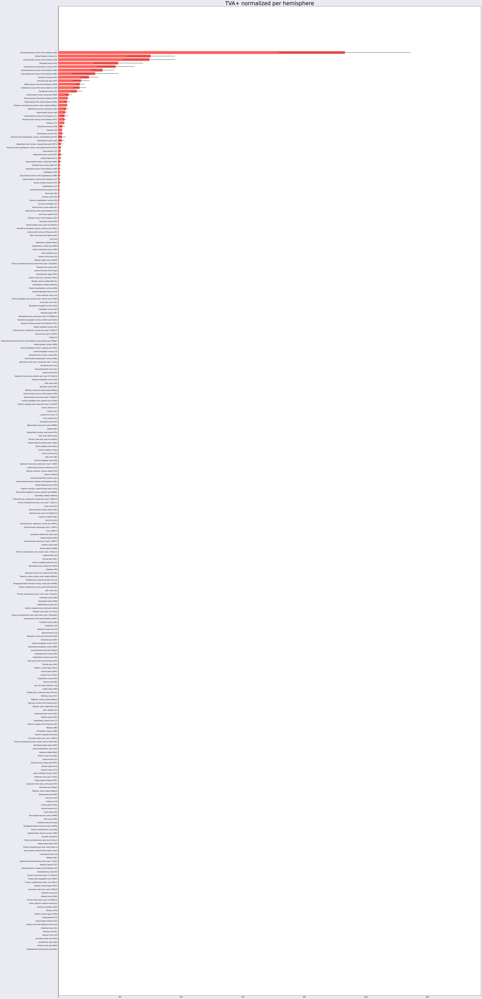

In [9]:
# Plot TVA+ normalized per hemisphere
x_label = '(TVA+ / Dapi area) / (total TVA+ / total Dapi area)'

tva = mean_results['TVA']['PerHemi']
fig = plot_horizontal_bar_chart(tva, brain_region_dict)

plt.title('TVA+ normalized per hemisphere',fontsize=35)
output_file = os.path.join(root, 'tva_normalized_per_hemi.pdf')
plt.savefig(output_file, bbox_inches='tight')
plt.show()

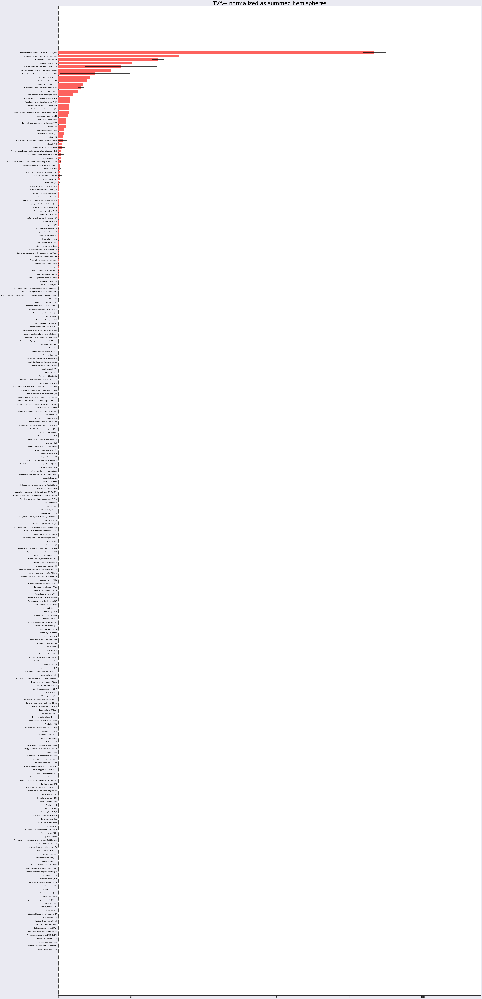

In [10]:
# Plot TVA+ normalized with summed hemispheres
tva = mean_results['TVA']['SummedHemi']
fig = plot_horizontal_bar_chart(tva, brain_region_dict)

plt.title('TVA+ normalized as summed hemispheres',fontsize=35)
output_file = os.path.join(root, 'tva_normalized_sum.pdf')
plt.savefig(output_file, bbox_inches='tight')
plt.show()

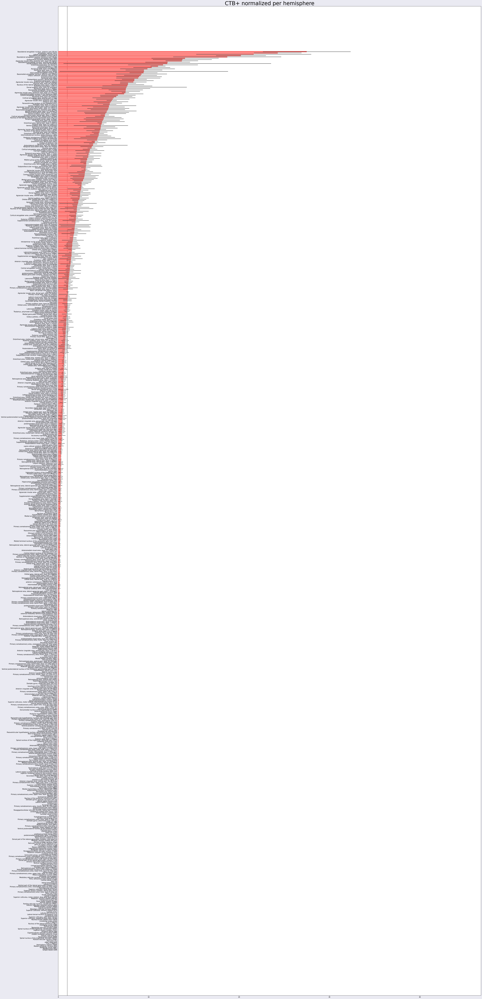

In [11]:
# Plot CTB+ normalized per hemisphere
ctb = mean_results['CTB']['PerHemi']
fig = plot_horizontal_bar_chart(ctb, brain_region_dict)

plt.title('CTB+ normalized per hemisphere',fontsize=35)
output_file = os.path.join(root, 'ctb_normalized_per_hemi.pdf')
plt.savefig(output_file, bbox_inches='tight')
plt.show()

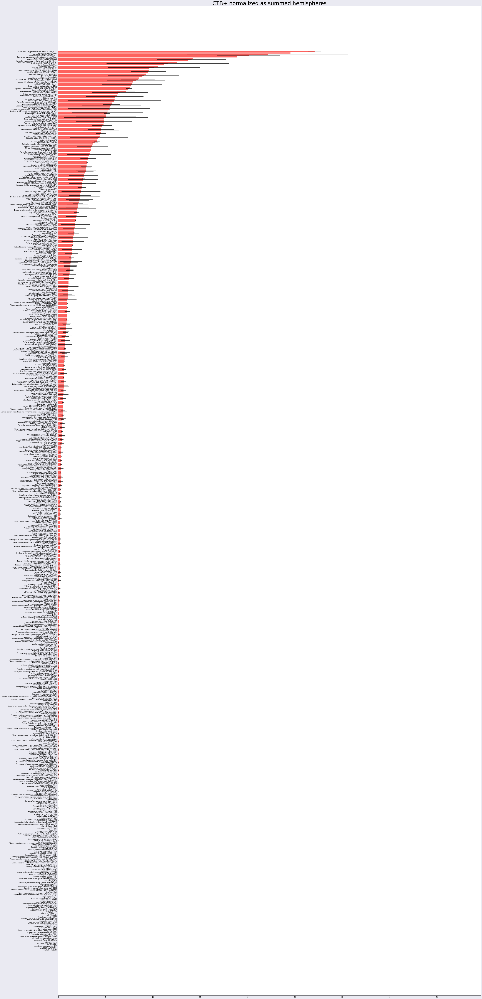

In [12]:
# Plot CTB+ normalized with summed hemispheres
ctb = mean_results['CTB']['SummedHemi']
fig = plot_horizontal_bar_chart(ctb, brain_region_dict)

plt.title('CTB+ normalized as summed hemispheres',fontsize=35)
output_file = os.path.join(root, 'ctb_normalized_sum.pdf')
plt.savefig(output_file, bbox_inches='tight')
plt.show()

In [13]:
results.loc['FRP6b']

RAB  Left   TRIO2_11261_Lukas       0.0
     Right  TRIO2_11261_Lukas       NaN
     Sum    TRIO2_11261_Lukas       0.0
     Left   TRIO2_11876_Lukas_v2    0.0
     Right  TRIO2_11876_Lukas_v2    0.0
     Sum    TRIO2_11876_Lukas_v2    0.0
CTB  Left   TRIO2_11261_Lukas       0.0
     Right  TRIO2_11261_Lukas       NaN
     Sum    TRIO2_11261_Lukas       0.0
     Left   TRIO2_11876_Lukas_v2    0.0
     Right  TRIO2_11876_Lukas_v2    0.0
     Sum    TRIO2_11876_Lukas_v2    0.0
TVA  Left   TRIO2_11261_Lukas       0.0
     Right  TRIO2_11261_Lukas       NaN
     Sum    TRIO2_11261_Lukas       0.0
     Left   TRIO2_11876_Lukas_v2    0.0
     Right  TRIO2_11876_Lukas_v2    0.0
     Sum    TRIO2_11876_Lukas_v2    0.0
Name: FRP6b, dtype: float64